# Project 1 - Computer Vision
## Kacper Trębacz 145453
## Jan Gruszczyński 145464

We have picked the problem concering removal of people from images of cathedral.

Name of the problem: "Creating a clean plate"

In [65]:
import cv2
import numpy
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import operator
from skimage.feature import hog
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment

In [5]:
# Loads all images except for the result one. 
def load_images():
    path = Path("cathedral")
    result_path = path/"result.png"
    img_paths = [p for p in path.iterdir() if str(p) !=str(result_path)]
    img_paths = sorted(img_paths)
    images = np.array([cv2.imread(str(p), cv2.IMREAD_COLOR) for p in img_paths])
    print("Lenght of the loaded images list: ",len(images))
    return images

Lenght of the loaded images list:  5


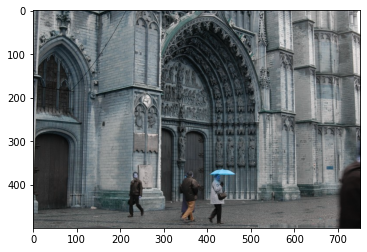

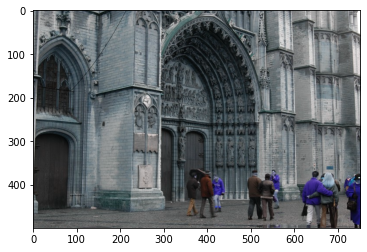

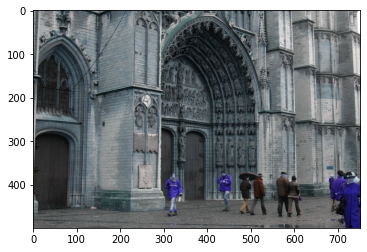

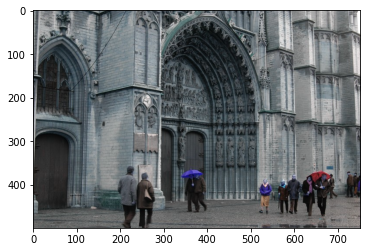

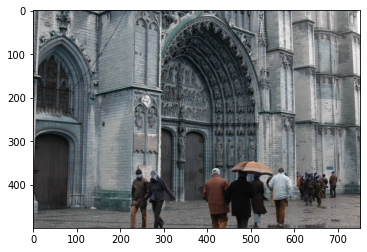

In [110]:
imgs = load_images()
#For verification, prinitng all the images.
for img in imgs:
    plt.imshow(img)
    plt.show()

## Our first naive approaches:

### Mean filter

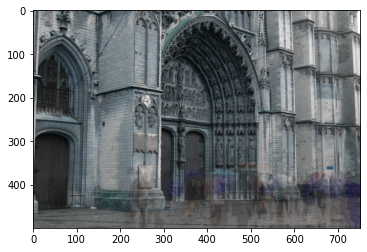

In [37]:
plt.imshow(np.mean(imgs, axis=0).astype(np.uint16))
plt.show()

### Median filter

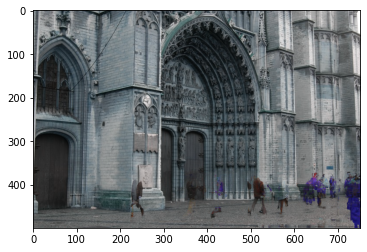

In [38]:
median_filter = np.median(imgs, axis=0).astype(np.uint16)
plt.imshow(median_filter)
plt.show()

### Picking pixels that are the closest to the mean of pixels (respecitvely for each group of 5s images)

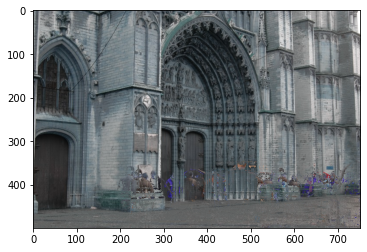

In [39]:
mean = np.mean(imgs,axis=(0,1,2))
distances = np.sum((imgs - mean)**2, axis=3)
indices = np.argmin(distances, axis = 0)
indices = np.stack((indices,)*3, axis=-1)
our_result = np.take_along_axis(imgs, indices[np.newaxis], axis=0)[0]
plt.imshow(our_result)
plt.show()

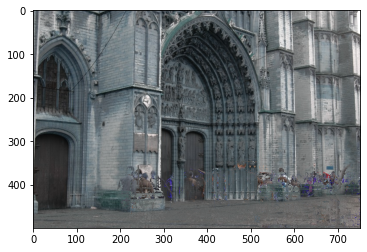

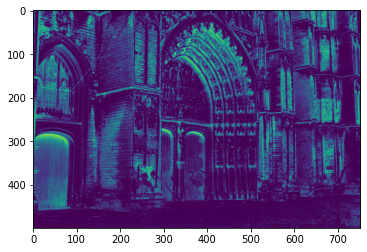

In [41]:
# Added penalty for certain colors. 
mean = np.mean(imgs,axis=(0,1,2))
m = 2
distance_candidates = (np.sum((imgs - color)**m, axis=3) for color in [mean, np.array([255,255,255]), np.array([81,96,93])])
distances = np.min(np.stack(distance_candidates, axis = -1), axis=-1)
indices = np.argmin(distances, axis = 0)
indices = np.stack((indices,)*3, axis=-1)
our_result = np.take_along_axis(imgs, indices[np.newaxis], axis=0)[0]
plt.imshow(our_result)
plt.show()
plt.imshow(np.min(distances, axis=0))
plt.show()

### Detecting edges

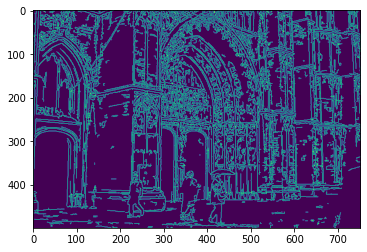

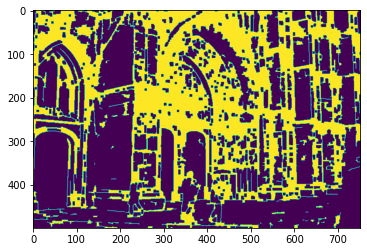

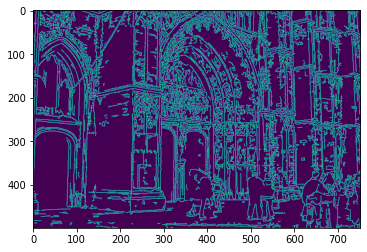

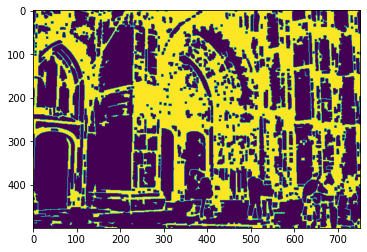

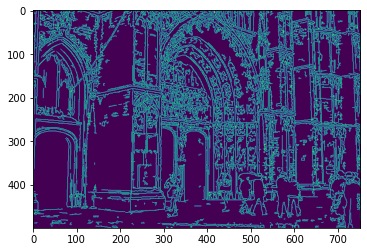

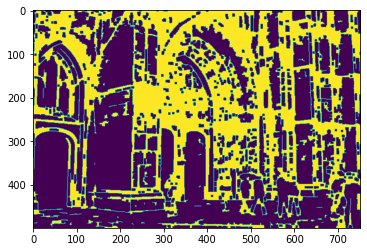

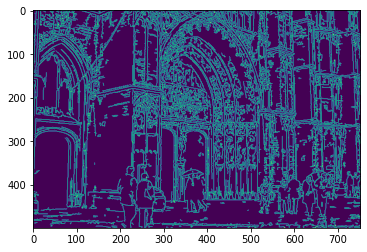

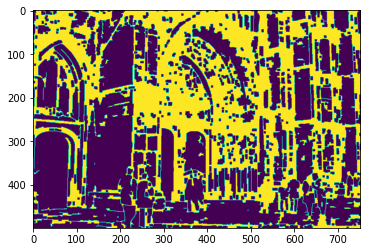

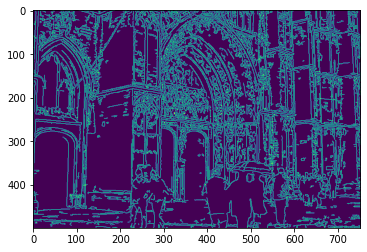

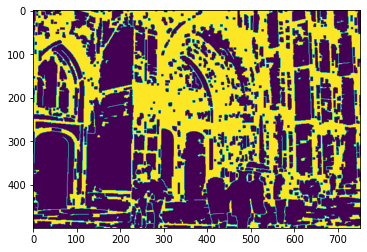

In [42]:
for img in imgs:
    edges = cv2.Canny(img,100,200)
    plt.imshow(edges)
    plt.show()
    struct = np.ones([5, 5], np.uint8)
    cls = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, struct)
    plt.imshow(cls)
    plt.show()

[255]


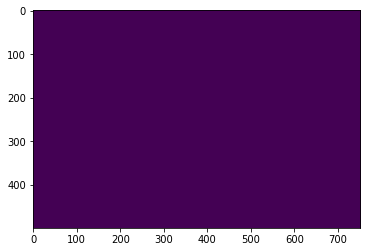

[255]


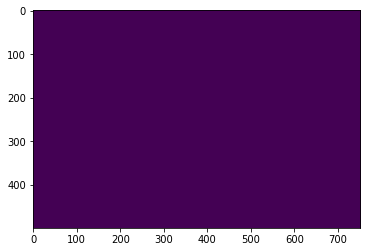

[  0 255]


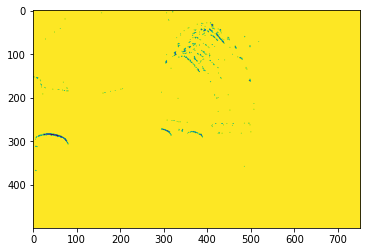

[  0 255]


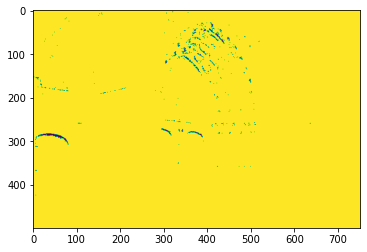

[  0 127 255]


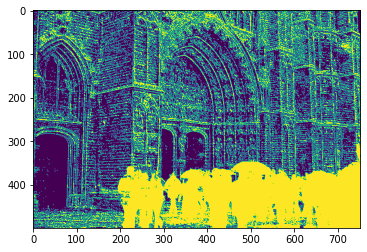

In [43]:
backSub = cv2.createBackgroundSubtractorKNN()
for img in imgs:
    fgMask = backSub.apply(img)
    print(np.unique(fgMask))
    plt.imshow(fgMask)
    plt.show()

## Improved probalistic approach:
### Picking the most common pixels, but allowing for certain error.

In [46]:
#Counts pixels different by (1-param1)% or (1+param2)% as the same pixels
#Please know that this method is highly inefficient!
def pick_right_pixel(pixels, param1=0.15, param2=0.15):
    a_dict = {}
    a_dict[tuple(pixels[0])] = 1
    for pixel in pixels[1:]:
        should_continue = False
        for key, value in a_dict.items():
            truths = [r * (1 - param1) <= rp <= r * (1 + param2) for r, rp in zip(key, pixel)]
            if all(truths):
                a_dict[key] += 1
                should_continue = True
                break
        if should_continue:
            continue
        else:
            a_dict[tuple(pixel)] = 1
    check_point = [True if value == 1 else False for value in a_dict.values()]
    if all(check_point):
        # if len(a_dict.keys()) < 5:
        #     print(a_dict)
        #     print(np.array(pixels))
        #     print()

        return list(np.mean(pixels, axis=0).astype(np.int32))
    best_pixel = max(a_dict.items(), key=operator.itemgetter(1))[0]
    return best_pixel

In [49]:
def most_common_pixel(images, param1, param2):
    images = [image.reshape(-1, 3) for image in images]
    final_image = []
    for dd in range(0, images[0].shape[0]):
        pixels = [list(images[x][dd]) for x in range(0, len(images))]
        best_pixel = pick_right_pixel(pixels, param1, param2)
        final_image.append(list(best_pixel))

    final_image = np.array(final_image)
    final_image = final_image.reshape((500, 752, 3))
    plt.title(str(param1) + " " + str(param2))
    plt.imshow(final_image)
    plt.show()

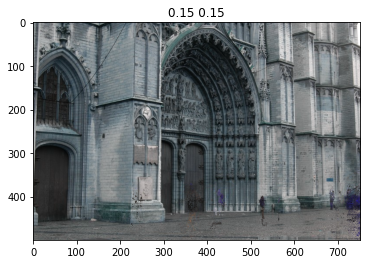

In [54]:
images = load_images()
most_common_pixel(images, param1=0.15, param2=0.15)

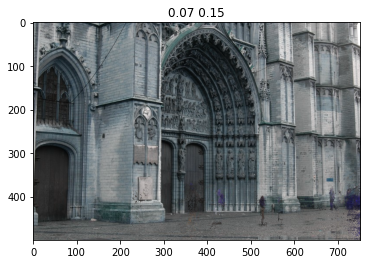

In [55]:
images = load_images()
most_common_pixel(images, param1=0.07, param2=0.15)

### Avoiding certain colors:

In [61]:
#Counts pixels different by (1-param1)% or (1+param2)% as the same pixels
def pick_right_pixel(pixels, param1=0.15, param2=0.15):
    a_dict = {}
    a_dict[tuple(pixels[0])] = 1
    for pixel in pixels[1:]:
        should_continue = False
        for key, value in a_dict.items():
            truths = [r * (1 - param1) <= rp <= r * (1 + param2) for r, rp in zip(key, pixel)]
            if all(truths):
                a_dict[key] += 1
                should_continue = True
                break
        if should_continue:
            continue
        else:
            a_dict[tuple(pixel)] = 1
            
    # This colors will be avoided
    avoid = [[149, 26, 32],
             [215, 117, 121],
             [150, 10, 20],
             [206, 71, 60]]
    

    to_remove_keys = []
    for to_avoid in avoid:
        for key, value in a_dict.items():
            difference_squared = np.sum((np.array(key) - np.array(to_avoid)) ** 2)
            if difference_squared < 1500:
                to_remove_keys.append(key)
                
    for key in set(to_remove_keys):
        del a_dict[key]
#     print(to_remove_keys)

    check_point = [True if value == 1 else False for value in a_dict.values()]
    if all(check_point):
        return list(np.mean(pixels, axis=0).astype(np.int32))
    best_pixel = max(a_dict.items(), key=operator.itemgetter(1))[0]
    return best_pixel

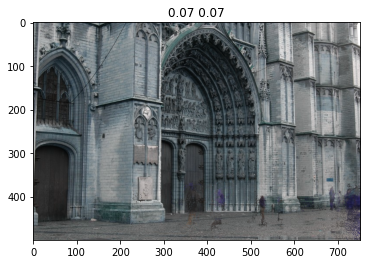

In [62]:
images = load_images()
most_common_pixel(images, param1=0.07, param2=0.07)

### Trying the same, but using change in HOG values. 
Inspiration:
https://towardsdatascience.com/hog-histogram-of-oriented-gradients-67ecd887675f

In [95]:

def pick_the_best_pixel_using_hog(images, hogs, param1, param2):
    images = [image.reshape(-1, 3) for image in images]
    hogs = [hog.reshape(-1) for hog in hogs]
    final_image = []
    for dd in range(0, images[0].shape[0]):
        pixels = [list(images[x][dd]) for x in range(0, len(images))]
        hogs5 = [hogs[x][dd] for x in range(0, len(images))]
        best_pixel = pick_right_pixel(pixels, hogs5, param1, param2)
        final_image.append(list(best_pixel))

    final_image = np.array(final_image)
    final_image = final_image.reshape((500, 752, 3))
    plt.title(str(param1) + " " + str(param2))
    plt.imshow(final_image)
    plt.show()


def pick_right_pixel(pixels, hogs, param1=0.15, param2=0.15):
    a_dict = {}
    a_dict[(tuple(pixels[0]), hogs[0])] = 1
    my_hog = hogs[0]

    for id_, hog_ in enumerate(hogs[1:]):
        should_continue = False
        for key, value in a_dict.items():
            pixel, hog__ = key
            if hog__ * (1 - param1) <= hog_ <= hog__ * (1 + param2):
                a_dict[key] += 1
                should_continue = True
                break
        if should_continue:
            continue
        a_dict[(tuple(pixels[id_ + 1]), hogs[id_ + 1])] = 1

    best_pixel = max(a_dict.items(), key=operator.itemgetter(1))[0]
    return best_pixel[0]

Lenght of the loaded images list:  5


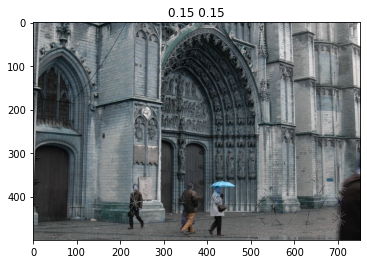

In [71]:
images = load_images()
hogs = []
for image in images:
    fd, hog_image = hog(image, orientations=8, pixels_per_cell=(36,36),
                        cells_per_block=(1, 1), visualize=True)
    hogs.append(hog_image)
pick_the_best_pixel_using_hog(images, hogs, 0.15, 0.15)

### Using CV2 seamlessClone function
Inspiration: https://learnopencv.com/seamless-cloning-using-opencv-python-cpp/

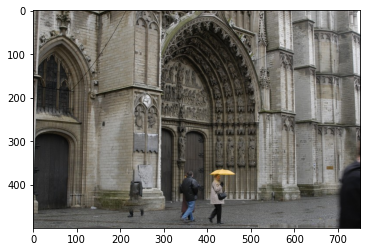

In [70]:
dst = cv2.imread("cathedral/d001.jpg")
src = cv2.imread("cathedral/d002.jpg")

# Create a rough mask around the human
src_mask = np.zeros(src.shape, src.dtype)
poly = np.array([[209,371], [280, 383], [200, 479] ,[285, 473]])
cv2.fillPoly(src_mask, [poly], (255, 255, 255))

center = (232, 411)

# Clone seamlessly.
output = cv2.seamlessClone(src, dst, src_mask, center, cv2.NORMAL_CLONE)

plt.imshow(output[:, :, ::-1])
plt.show()

## Detecting humans with Grabcut algorithm
Inspiration: https://www.pyimagesearch.com/2020/07/27/opencv-grabcut-foreground-segmentation-and-extraction/

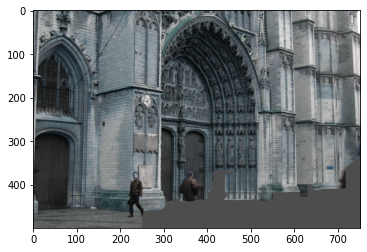

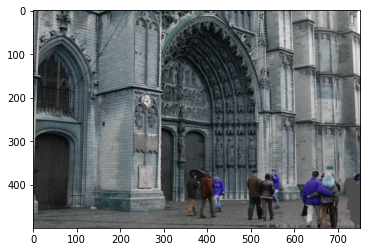

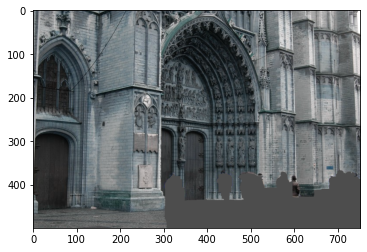

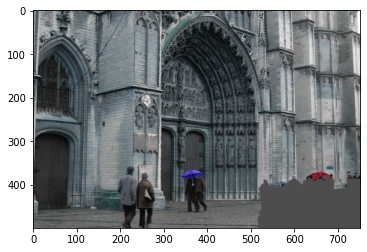

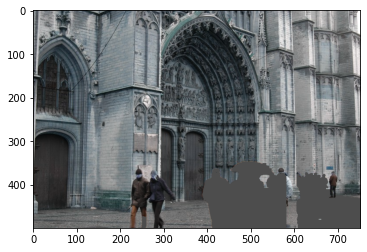

In [78]:
#This algorithm requries boxes to be marked by a human around humans.
def delete_people(img,img_bbox, border=250):
    def get_points(img,filter2d):
        cadidates = (cv2.filter2D(img, -1,filter2d) == 3).astype(np.uint8)
        corners = np.where(cadidates == 1)
        return [(x,y) for x,y in zip(corners[0], corners[1])]

    res = np.all((img_bbox == np.array([0,255,0])),axis=2).astype(np.uint8)
    left_up = np.array([
        [1,1],
        [1,-1]
    ])

    top_left_corners = get_points(res, left_up)

    right_bottom = np.array([
        [-1,1],
        [1,1]
    ])

    bottom_right_corners = get_points(res, right_bottom)
    distances = cdist(top_left_corners,bottom_right_corners)

    _, assigment = linear_sum_assignment(distances)
    boxes = [(top_left_corners[i][0],
              top_left_corners[i][1],
             bottom_right_corners[assigment[i]][0],
             bottom_right_corners[assigment[i]][1]) for i in range(len(assigment))]

    final_mask = np.zeros(img.shape[:2], dtype=np.uint8)

    for box in boxes:
        new_x1 = max(box[0]-border,0)
        new_y1 = max(box[1]-border,0)
        new_x2 = min(box[2]+border, img.shape[0])
        new_y2 = min(box[3]+border, img.shape[1])

        cur_img = img[new_x1:new_x2,new_y1:new_y2]
        rect = (box[0]-new_x1,box[1]-new_y1,box[2]-new_x1,box[3]-new_y1)
        mask = np.zeros(res.shape[:2], dtype="uint8")
        fgModel = np.zeros((1, 65), dtype="float")
        bgModel = np.zeros((1, 65), dtype="float")
        (mask, bgModel, fgModel) = cv2.grabCut(cur_img, mask, rect, bgModel,
            fgModel, 3, mode=cv2.GC_INIT_WITH_RECT)

        outputMask = np.where((mask == cv2.GC_BGD) | (mask == cv2.GC_PR_BGD),
            0,1)
        outputMask = (outputMask * 255).astype("uint8")
        final_mask[new_x1:new_x2,new_y1:new_y2] = outputMask
    output = cv2.bitwise_and(img, img, mask=255-final_mask)
    output[255-final_mask==0] = np.array([77,77,77])
    plt.imshow(output)
    plt.show()
    return output, final_mask
    
images  = []
for i in range(1,6):
    test = cv2.imread(f"boxes/d00{i}-boxes.png", cv2.IMREAD_COLOR)
    img = cv2.imread(f"cathedral/d00{i}.jpg", cv2.IMREAD_COLOR)
    output = delete_people(img,test)
    images.append(output[0])
# print(images)

Using obtained solution for the most common pixel method.

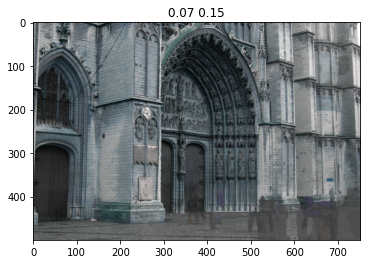

In [79]:
def pick_right_pixel(pixels, param1=0.15, param2=0.15):
    a_dict = {}
    a_dict[tuple(pixels[0])] = 1
    for pixel in pixels[1:]:
        should_continue = False
        for key, value in a_dict.items():
            truths = [r * (1 - param1) <= rp <= r * (1 + param2) for r, rp in zip(key, pixel)]
            if all(truths):
                a_dict[key] += 1
                should_continue = True
                break
        if should_continue:
            continue
        else:
            a_dict[tuple(pixel)] = 1

    # Ignoring detected humans
    to_remove_keys = [(77,77,77)]
    for key in set(to_remove_keys):
        try:
            del a_dict[key]
#             print("tutaj")
        except KeyError:
            continue

    check_point = [True if value == 1 else False for value in a_dict.values()]
    if all(check_point):
        return list(np.mean(pixels, axis=0).astype(np.int32))
    best_pixel = max(a_dict.items(), key=operator.itemgetter(1))[0]
    return best_pixel


def iterate(images, param1, param2):
    images = [image.reshape(-1, 3) for image in images]
    final_image = []
    for dd in range(0, images[0].shape[0]):
        pixels = [list(images[x][dd]) for x in range(0, len(images))]
        best_pixel = pick_right_pixel(pixels, param1, param2)
        final_image.append(list(best_pixel))

    final_image = np.array(final_image)
    final_image = final_image.reshape((500, 752, 3))
    plt.title(str(param1) + " " + str(param2))
    plt.imshow(final_image)
    plt.show()
#     return final_image
iterate(images, param1=0.07, param2=0.15)

This seems as the best result that we have obtained so far. wohooo! improvment!!!

## Final solution
10 hours later...
It was a long jurney to get here : D


In [1]:
from pathlib import Path
import cv2
import numpy as np
import imutils as imutils
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as compare_ssim
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment
import time

We will try describe this solution more, as this is the final perfectly working one.

Inspiration:
https://www.py4u.net/discuss/14401
(Inspiration only concers finding the differences between images, not the frame method presented below!)

Lenght of the loaded images list:  5
Lenght of the loaded images list:  5


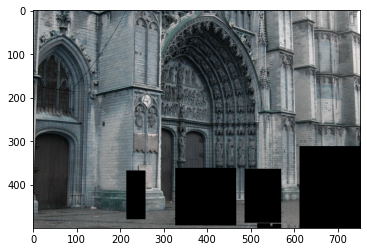

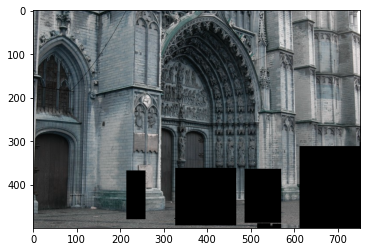

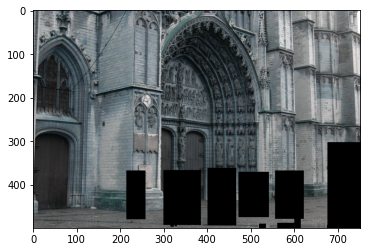

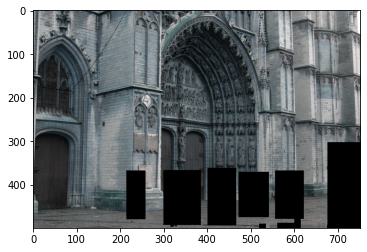

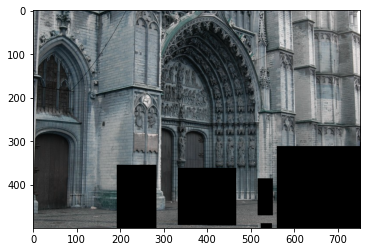

...

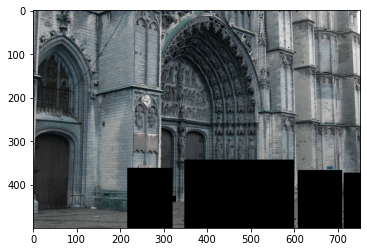

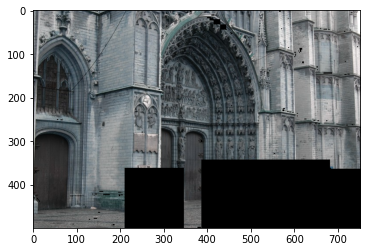

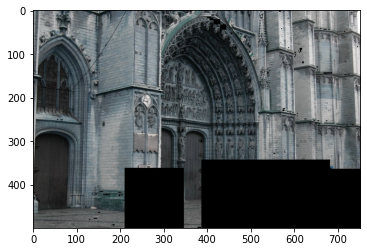

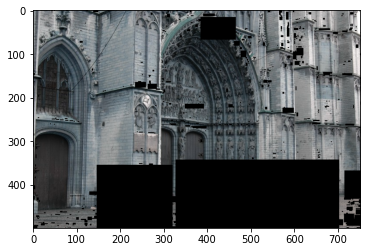

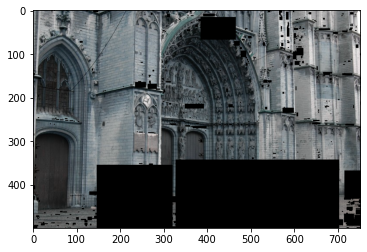

In [7]:
#Firstly we find differences between each consecutive pair of images, and we marked them as boxes. 
images = load_images()
images2 = load_images()
result = []

for imageA in images:
    for imageB in images2:
        if (imageA == imageB).all():
            continue

        grayA = cv2.cvtColor(imageA, cv2.COLOR_BGR2GRAY)
        grayB = cv2.cvtColor(imageB, cv2.COLOR_BGR2GRAY)

        (score, diff) = compare_ssim(grayA, grayB, full=True)
        diff = (diff * 255).astype("uint8")

        thresh = cv2.threshold(diff, 0, 255,
                               cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
        cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
                                cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)

        copy_imageA = np.copy(imageA)
        copy_imageB = np.copy(imageB)
        for c in cnts:
            # compute the bounding box of the contour and then draw the
            # bounding box on both input images to represent where the two
            # images differ
            (x, y, w, h) = cv2.boundingRect(c)
            cv2.rectangle(copy_imageA, (x, y), (x + w, y + h), (0, 0, 0), -1)
            cv2.rectangle(copy_imageB, (x, y), (x + w, y + h), (0, 0, 0), -1)
        result.append(copy_imageA)
        result.append(copy_imageB)
        plt.imshow(copy_imageA)
        plt.show()
#         time.sleep(0.5)
        plt.imshow(copy_imageB)
        plt.show()
#         time.sleep(0.6)

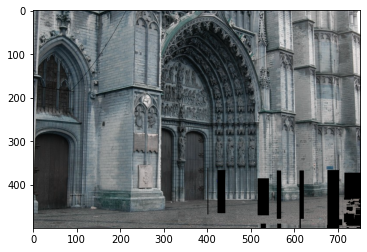

True

In [8]:
#Now we fill each black box with regions not marked by black boxes from other images.
final = np.full(images[0].shape, 0)
for i in range(0, len(result)):
    output = result[i]
    cur_mask = np.stack((np.all(final == np.array([0, 0, 0]), axis=-1),) * 3, axis=-1)
    final += output * cur_mask

plt.imshow(final)
plt.show()
cv2.imwrite("almost_final_result.png", final)
# Very simple solution but also very close to the perfect solution.

In [9]:
#Dividies big box into smaller boxes. 
def divide(x1, y1, x2, y2, n,m):
    result = []
    for i in range(n):
        for j in range(m):
            a = x1 + int(i*((x2-x1)/n))
            b = y1 + int(j*((y2-y1)/m))
            c = x1 + int((i+1)*((x2-x1)/n))
            d = y1 + int((j+1)*((y2-y1)/m))
            result.append((a,b,c,d))
    return result

### The magic frame method
This algorithm detects empty spaces (black boxes) on our images, then it finds their frames (of size equal to padding).
Then it searches those frames on other images, and finds the most similiar frame. From the image that has the most similiar frame, it copies it content to our black box. 
(Firstly the boxes are divided into smaller boxes, to improve the precission.

Lenght of the loaded images list:  5


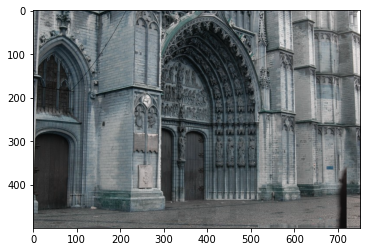

True

In [10]:
imgs = load_images()
img = cv2.imread("almost_final_result.png")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Turn the image into grayscale
gray[gray == 0] = 255
gray[gray != 255] = 0
contours, hierarchy = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
xd = [cv2.boundingRect(contour) for contour in contours]
for i in range(len(xd)):
    x, y, w, h = xd[i]
    bx1,by1,bx2,by2 = x,y,x+w,y+h 
    padding =10
    for x1,y1,x2,y2 in (divide(bx1,by1,bx2,by2,3,3) if abs(bx1-bx2) > 5 or abs(by2-by1) > 5 else [(bx1,by1,bx2,by2)]):
        x1,y1,x2,y2 = max(0,x1-padding),max(0,y1-padding),min(img.shape[1],x2+padding),min(img.shape[0],y2+padding)
        # Here we create the frames.
        cur_fragment = img[y1:y2,x1:x2]  
        min_error = float("Inf")
        min_error_image = None
        for input_img in imgs:
            #Creating mask, so we don't take into account black parts of the frames, while calculating difference
            mask = np.stack(((1 -np.all(cur_fragment == 0, axis=-1)).astype(np.uint8),)*3,axis=-1) 
            cur_input = input_img[y1:y2,x1:x2] 
            error = np.sum(((cur_fragment - cur_input)**2)*mask)
            #Ignoring certain ranges of colors. 
            lower = [np.array([120, 50, 50]), np.array([20, 20, 90]), np.array([100,110,140])]
            upper = [np.array([160, 70, 70]), np.array([40, 30, 110]), np.array([110,120,150])]
            if any(np.any(cv2.inRange(cur_input, l, u)) for l,u in zip(lower, upper)):
                error = float("Inf") 
            if error < min_error:
                min_error_image = cur_input
                min_error = error
        img[y1:y2,x1:x2] = min_error_image 

plt.imshow(img)
plt.show()
cv2.imwrite("almostReady.png", img)
# Wohooo the result is almost perfect!

Now we just have to get rid of this small black part, unfortunately, the user has to mark it.

In [12]:
#Dividies big box into smaller boxes. 
def divide(x1, y1, x2, y2, n,m):
    result = []
    for i in range(n):
        for j in range(m):
            a = x1 + int(i*((x2-x1)/n))
            b = y1 + int(j*((y2-y1)/m))
            c = x1 + int((i+1)*((x2-x1)/n))
            d = y1 + int((j+1)*((y2-y1)/m))
            result.append((a,b,c,d))
    return result

In [13]:
# Locates the marked region.
def detect_boxes(img, img_bbox):
    def get_points(img, filter2d):
        cadidates = (cv2.filter2D(img, -1, filter2d) == 3).astype(np.uint8)
        corners = np.where(cadidates == 1)
        return [(x, y) for x, y in zip(corners[0], corners[1])]
    res = np.all((img_bbox == np.array([0, 255, 0])), axis=2).astype(np.uint8)
    
    left_up = np.array([
        [1, 1],
        [1, -1]
    ])
    # Find top left corner using convolution.
    top_left_corners = get_points(res, left_up)
    
    #Similar sitiatuin as above
    right_bottom = np.array([
        [-1, 1],
        [1, 1]
    ])

    bottom_right_corners = get_points(res, right_bottom)
    distances = cdist(top_left_corners, bottom_right_corners)

    _, assigment = linear_sum_assignment(distances)
    boxes = [(top_left_corners[i][0],
              top_left_corners[i][1],
              bottom_right_corners[assigment[i]][0],
              bottom_right_corners[assigment[i]][1]) for i in range(len(assigment))]

    return boxes


Lenght of the loaded images list:  5


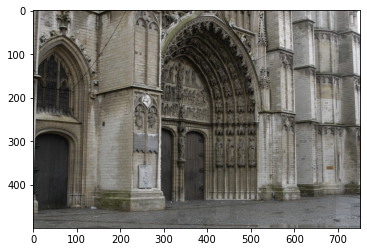

True

In [15]:
imgs = load_images()
imgs.shape

img = cv2.imread("almostReady.png")
# Here we loaded the image above with marked region
img_box = cv2.imread("almostReadyBox.png")

boxes = detect_boxes(img, img_box)
final_mask = np.zeros(img.shape[:2], dtype=np.uint8)

border = 100
padding = 5
#Using the frame method, to remove the marked region
for box in boxes:
    bx1, by1, bx2, by2 = box[1], box[0], box[3], box[2]
    #We divided further the marked region into 5 columns and 10 rows.
    for x1, y1, x2, y2 in (
    divide(bx1, by1, bx2, by2, 5, 10) if abs(bx1 - bx2) > 5 or abs(by2 - by1) > 5 else [(bx1, by1, bx2, by2)]):
        x1, y1, x2, y2 = max(0, x1 - padding), max(0, y1 - padding), min(img.shape[1], x2 + padding), min(img.shape[0],
                                                                                                          y2 + padding)
        cur_fragment = img[y1:y2, x1:x2]
        mask = np.all(cur_fragment == 0, axis=-1)
        min_error = float("Inf")
        min_error_image = None
        for input_img in imgs:
            #Ignoring black part of the frames.
            mask = np.stack(((1 - np.all(cur_fragment == 0, axis=-1)).astype(np.uint8),) * 3, axis=-1)
            cur_input = input_img[y1:y2, x1:x2]
            error = np.sum(((cur_fragment - cur_input) ** 2) * mask)
            
            #Penalty for certain colors
            lower = [np.array([120, 50, 50]), np.array([20, 20, 90]), np.array([0, 0, 0])]
            upper = [np.array([160, 70, 70]), np.array([40, 30, 110]), np.array([40, 40, 40])]
            if any(np.any(cv2.inRange(cur_input, l, u)) for l, u in zip(lower, upper)):
                penalty_c = np.stack([cv2.inRange(cur_input, l, u) for l, u in zip(lower, upper)], axis=-1)
                penalty_c = np.any(penalty_c, axis=-1)
                penalty = np.sum(penalty_c)
                error += penalty * 100000
            if error < min_error:
                min_error_image = cur_input
                min_error = error
        if type(min_error_image) != None:
            img[y1:y2, x1:x2] = min_error_image

plt.imshow(img[:,:,::-1])
plt.show()
cv2.imwrite("result.png", img)
# voilà!

## Testing different dataset (We weren't able to find non-trivial datasets available for free)
Unfortunately we weren't able (despite spending a lot of time for them) to find non-trivial datasets as hard as the one seen above avaiable for free. 

Usually the simple method with detecting difference sufficed to remove any people from images.

In [103]:
def load_images():
    path = Path("dataset")
    result_path = path/"result.png"
    img_paths = [p for p in path.iterdir() if str(p) !=str(result_path)]
    img_paths = sorted(img_paths)
    images = np.array([cv2.imread(str(p), cv2.IMREAD_COLOR) for p in img_paths])
    print("Lenght of the loaded images list: ",len(imgs))
    return images

Lenght of the loaded images list:  5


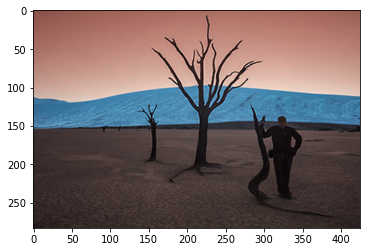

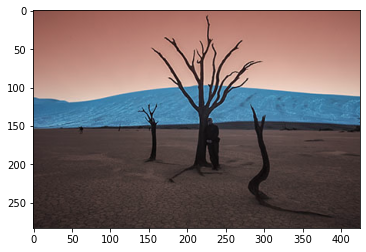

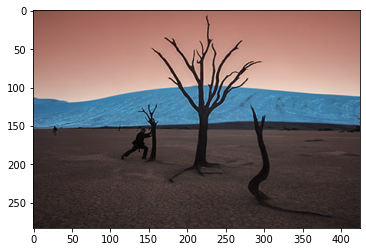

In [106]:
imgs = load_images()
# For verification, prinitng all the images.
for img in imgs:
    plt.imshow(img)
    plt.show()

Lenght of the loaded images list:  5
Lenght of the loaded images list:  5


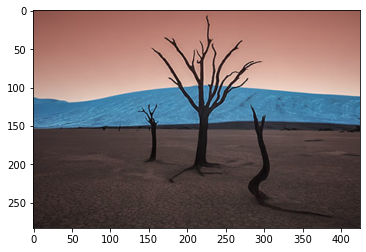

In [105]:
#Firstly we find differences between each consecutive pair of images, and we marked them as boxes. 
images = load_images()
images2 = load_images()
result = []

for imageA in images:
    for imageB in images2:
        if (imageA == imageB).all():
            continue

        grayA = cv2.cvtColor(imageA, cv2.COLOR_BGR2GRAY)
        grayB = cv2.cvtColor(imageB, cv2.COLOR_BGR2GRAY)

        (score, diff) = compare_ssim(grayA, grayB, full=True)
        diff = (diff * 255).astype("uint8")

        thresh = cv2.threshold(diff, 0, 255,
                               cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
        cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
                                cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)

        copy_imageA = np.copy(imageA)
        copy_imageB = np.copy(imageB)
        for c in cnts:
            # compute the bounding box of the contour and then draw the
            # bounding box on both input images to represent where the two
            # images differ
            (x, y, w, h) = cv2.boundingRect(c)
            cv2.rectangle(copy_imageA, (x, y), (x + w, y + h), (0, 0, 0), -1)
            cv2.rectangle(copy_imageB, (x, y), (x + w, y + h), (0, 0, 0), -1)
        result.append(copy_imageA)
        result.append(copy_imageB)

#Now we fill each black box with regions not marked by black boxes from other images.
final = np.full(images[0].shape, 0)
for i in range(0, len(result)):
    output = result[i]
    cur_mask = np.stack((np.all(final == np.array([0, 0, 0]), axis=-1),) * 3, axis=-1)
    final += output * cur_mask

plt.imshow(final)
plt.show()

# Very simple solution but also very close to the perfect solution.

## Thank you for reading.